## Загрузка библиотек

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import numpy as np

In [2]:
matplotlib inline

## Загрузка данных

### Задание 1 (0.5 балла)

Для начала работы нам необходимо научиться читать набор данных. В данном домашнем задании мы поработаем с двумя наборами данных.

__covid.csv__ ([источник](https://www.kaggle.com/gpreda/covid-world-vaccination-progress)) - статистика по вакцинированию от COVID19 по разным странам. Для данного датасета нет конкретной предсказательной переменной.

__hr.csv__ ([источник](https://www.kaggle.com/arashnic/hr-analytics-job-change-of-data-scientists)) - набор данных большего размера. Он содержит статистику по людям, проходящим курсы по Big Data & ML. _Target_ - 1 или 0, сменил ли человек работу после прохождения курсов - или нет.

Реализуйте методы `read_covid_dataset` и `read_hr_dataset`. Каждый из них принимает на вход путь к набору данных и возвращает выборку `X` и соответствующие метки `y`. В случае _covid_ датасета `y` возвращается как `None`. 

In [3]:
def read_covid_dataset(path_to_csv):
    X = pd.read_csv(path_to_csv)
    y = pd.Series([None] * len(X.index))
    return X, y


def read_hr_dataset(path_to_csv):
    df = pd.read_csv(path_to_csv)
    X, y = df.drop(columns='target'), pd.DataFrame({'target': df['target']})
    return X, y

In [4]:
COVID_DATA_PATH = "C:/Users/лиза/Desktop/учеба/BI/ml/covid.csv"
HR_DATA_PATH = "C:/Users/лиза/Desktop/учеба/BI/ml/hr.csv"

In [5]:
X_covid, _ = read_covid_dataset(COVID_DATA_PATH)
X_hr, y_hr = read_hr_dataset(HR_DATA_PATH)

## EDA

### Задание 2 (3.5 балла)

Выполните задание для датасетa _hr_.

Для дальнейшей работы с данными нужно обработать пропущенные значения в датасете.
Существуют различные стратегии обработки пропущенных данных.

#### 1. (0.5 балла)

Для числовых признаков постройте распределения признаков. Для категориальных признаков выведите статистику по количеству значений признака.

In [6]:
prof_X_hr = ProfileReport(X_hr, title="X_hr Profiling Report")
prof_X_hr

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
cat = ['city', 'gender', 'relevent_experience',
        'enrolled_university', 'education_level',
        'major_discipline', 'experience', 
        'company_size', 'company_type', 'last_new_job']
name = ['enrollee_id', 'city_development_index', 'training_hours']

In [56]:
def stat_cat(name, cat, X):
    for c in cat:
        print(f'{c} statistics\n')
        print(X[c].value_counts(), '\n')
        
    for n in name:
        sns.displot(X, x=f'{n}', stat="probability")   

Судя по статистике, выведенной с помощью ProfileReport, в датасете есть 10 категориальных признаков, статистики, которых выведем ниже.

Также построим распределения количественных признаков.

city statistics

city_103    4355
city_21     2702
city_16     1533
city_114    1336
city_160     845
            ... 
city_129       3
city_111       3
city_121       3
city_140       1
city_171       1
Name: city, Length: 123, dtype: int64 

gender statistics

Male      13221
Female     1238
Other       191
Name: gender, dtype: int64 

relevent_experience statistics

Has relevent experience    13792
No relevent experience      5366
Name: relevent_experience, dtype: int64 

enrolled_university statistics

no_enrollment       13817
Full time course     3757
Part time course     1198
Name: enrolled_university, dtype: int64 

education_level statistics

Graduate          11598
Masters            4361
High School        2017
Phd                 414
Primary School      308
Name: education_level, dtype: int64 

major_discipline statistics

STEM               14492
Humanities           669
Other                381
Business Degree      327
Arts                 253
No Major             223
Nam

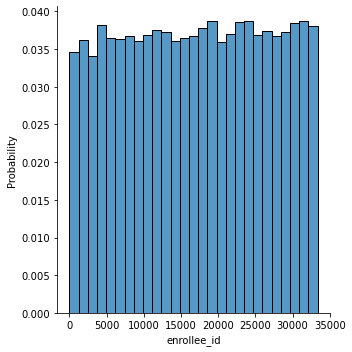

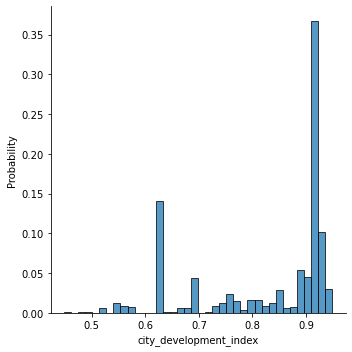

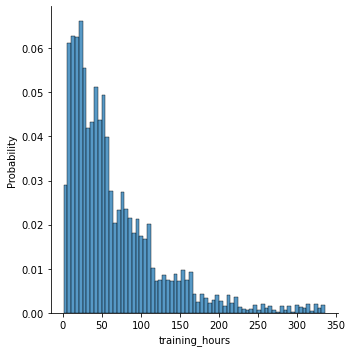

In [8]:
stat_cat(name, cat, X_hr)

#### 2. (0.5 балла)
Удалите все строки, где есть хотя бы одно пропущенное значение признака. Насколько сильно уменьшился размер датасета? Как изменились распределения признаков/статистика по количеству значений признаков?

In [9]:
print(f'Исходный размер датасета hr {len(X_hr)}')

Исходный размер датасета hr 19158


In [10]:
X_hr_dropna = X_hr.dropna()

In [11]:
print(f'Pазмер датасета hr без NaN {len(X_hr_dropna)}')

Pазмер датасета hr без NaN 8955


Размер датасета уменьшился более чем в два рааза. Посмотрим статистику.

city statistics

city_103    2426
city_21     1111
city_16      836
city_114     648
city_160     401
            ... 
city_127       1
city_107       1
city_62        1
city_109       1
city_25        1
Name: city, Length: 116, dtype: int64 

gender statistics

Male      8073
Female     804
Other       78
Name: gender, dtype: int64 

relevent_experience statistics

Has relevent experience    7851
No relevent experience     1104
Name: relevent_experience, dtype: int64 

enrolled_university statistics

no_enrollment       7594
Full time course     832
Part time course     529
Name: enrolled_university, dtype: int64 

education_level statistics

Graduate    6252
Masters     2449
Phd          254
Name: education_level, dtype: int64 

major_discipline statistics

STEM               7989
Humanities          378
Other               177
Business Degree     170
Arts                129
No Major            112
Name: major_discipline, dtype: int64 

experience statistics

>20    1881
5       575


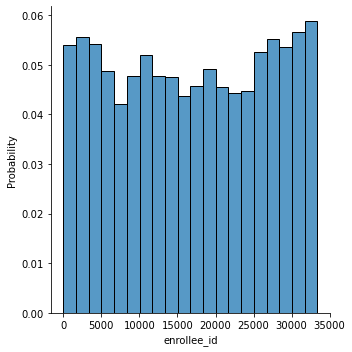

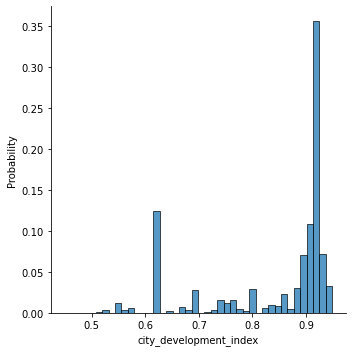

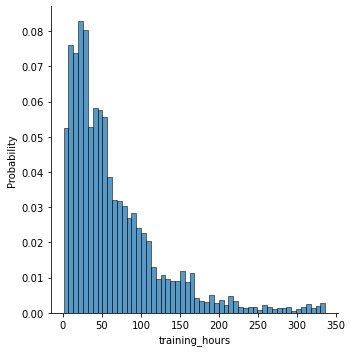

In [12]:
stat_cat(name, cat, X_hr_dropna)

Можно отметить, что в результате удаление строк с пустыми значениями у city_development_index увеличилось среднее значение, а у training_hours уменьшилось среднее значение.

In [14]:
X_hr_dropna.describe()

,enrollee_id,city_development_index,training_hours
count,8955.000000,8955.000000,8955.000000
mean,16869.638749,0.844570,65.074930
std,9963.804718,0.116178,60.235087
min,2.000000,0.448000,1.000000
25%,8150.000000,0.794000,23.000000
50%,16924.000000,0.910000,47.000000
75%,25902.000000,0.920000,88.000000
max,33380.000000,0.949000,336.000000


Давайте попробуем избежать сокращения размера датасета.

#### 3.  (1 балл)
Для числовых признаков заполните пропущенные данные средним/медианой/модой данного признака. Объясните свой выбор. (Часть строк с NaN значениями можно удалить, если размер датасета уменьшится <15%)

Судя по X_hr Profiling Report, в числовых признаках пропуски отсутствуют.

#### 4.  (1 балл)
Для категориальных признаков заполните пропущенные значения самой встречающейся категорией или создайте отдельную категорию пропущенных значений. Объясните свой выбор. (Часть строк с NaN значениями можно удалить, если размер датасета уменьшится <15%)

Самая часто встречающаяся категория -- мода. Поэтому для заполнения пустых ячеек будем использовать функцию mode(). Придумать какие-то свои отдельные категории для данного датасета затруднительно.

In [29]:
def fill_na(X, y):
    for column in X:
        if False in X[column].isna(): 
            X[column].fillna(X[column].mode()[0], inplace=True)
    X_fill, y_fill = X, y
    return X_fill, y_fill

In [30]:
X_hr_fill, y_hr_fill = fill_na(X_hr, y_hr)

In [31]:
X_hr_fill

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,enrol_freq_encode
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,36,0.721213
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0.721213
2,11561,city_21,0.624,Male,No relevent experience,Full time course,Graduate,STEM,5,50-99,Pvt Ltd,never,83,0.196106
3,33241,city_115,0.789,Male,No relevent experience,no_enrollment,Graduate,Business Degree,<1,50-99,Pvt Ltd,never,52,0.721213
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0.721213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19153,7386,city_173,0.878,Male,No relevent experience,no_enrollment,Graduate,Humanities,14,50-99,Pvt Ltd,1,42,0.721213
19154,31398,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,14,50-99,Pvt Ltd,4,52,0.721213
19155,24576,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,4,44,0.721213
19156,5756,city_65,0.802,Male,Has relevent experience,no_enrollment,High School,STEM,<1,500-999,Pvt Ltd,2,97,0.721213


#### 5.  (0.5 балла)
Как изменились распределения признаков/статистика по количеству значений признаков после заполнения пропущенных данных?

city statistics

city_103    4355
city_21     2702
city_16     1533
city_114    1336
city_160     845
            ... 
city_129       3
city_111       3
city_121       3
city_140       1
city_171       1
Name: city, Length: 123, dtype: int64 

gender statistics

Male      14610
Female     1238
Other       191
Name: gender, dtype: int64 

relevent_experience statistics

Has relevent experience    13792
No relevent experience      5366
Name: relevent_experience, dtype: int64 

enrolled_university statistics

no_enrollment       13940
Full time course     3757
Part time course     1198
Name: enrolled_university, dtype: int64 

education_level statistics

Graduate          11702
Masters            4361
High School        2017
Phd                 414
Primary School      308
Name: education_level, dtype: int64 

major_discipline statistics

STEM               15041
Humanities           669
Other                381
Business Degree      327
Arts                 253
No Major             223
Nam

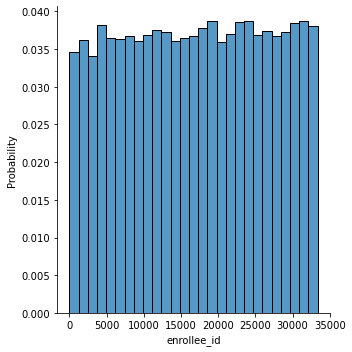

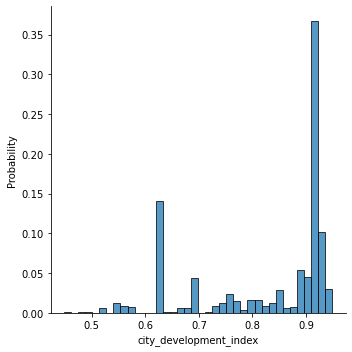

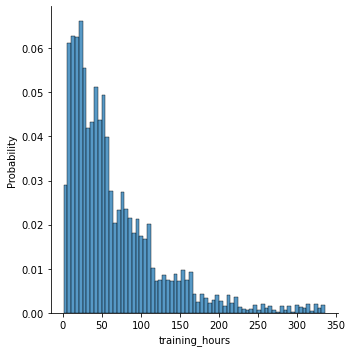

In [15]:
stat_cat(name, cat, X_hr_fill)

Видно, что наиболее число наиболее часто встречающихся значений в категориальных признаков увеличилось после заполнения пропусков.

### Задание 3  (1 балл)

Выполните задание для датасета _covid_.

1. Найдите страну, для которой в датасете присутствует 46 дат со статистикой по вакцинации.
2. Постройте для этой страны график зависимости _total_vaccinations_ от _date_.
3. Заполните пропущенные данные о _total_vaccinations_ для этой страны. Объясните свой выбор.

In [62]:
prof_X_covid = ProfileReport(X_covid, title="X_covid Profiling Report")
prof_X_covid

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Надем необходимую страну.

In [19]:
counts = X_covid['country'].value_counts()
res = counts[counts == 46].index
print(res)

Index(['Bahrain'], dtype='object')


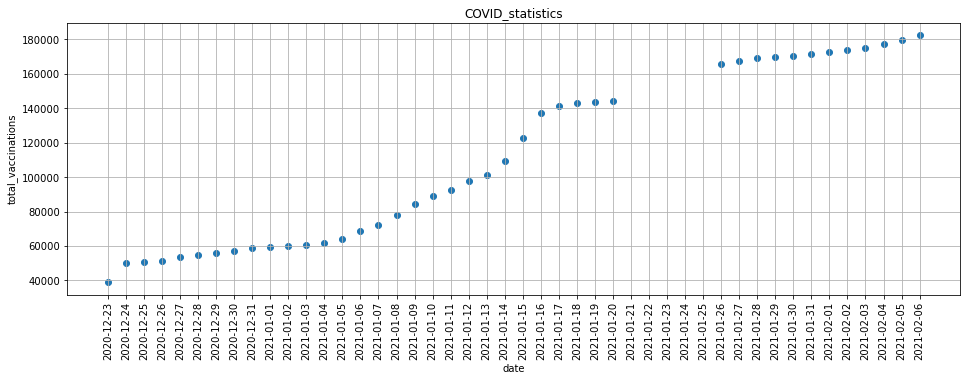

In [20]:
X_covid_B = X_covid[X_covid['country'] == 'Bahrain']
fig = plt.figure(figsize = (16, 5))
plt.scatter(X_covid_B['date'], X_covid_B['total_vaccinations'])
plt.title('COVID_statistics')
plt.xlabel('date')
plt.ylabel('total_vaccinations')
plt.xticks(rotation=90)
plt.grid()
None

Заполнять данные средним значением нет смысла, поскольку общее количество вакцинированных -- возрастающая функция. А среднее значение для данных будет меньше, чем пропущенные. Аналогично не подоходит медиана. Мода также не подходит для заполнения пропусков, потому что функция возрастает. Поэтому используем интерполяцию линейной функцией недостающих данных.

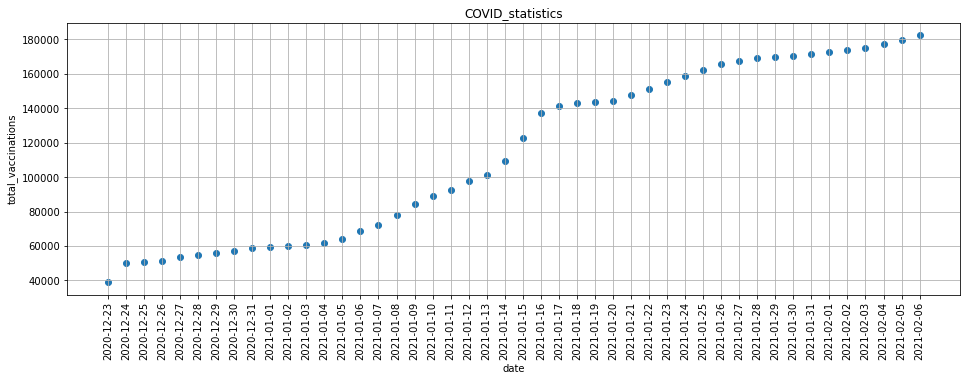

In [21]:
fig = plt.figure(figsize = (16, 5))
plt.scatter(X_covid_B['date'], X_covid_B['total_vaccinations'].interpolate())
plt.title('COVID_statistics')
plt.xlabel('date')
plt.ylabel('total_vaccinations')
plt.xticks(rotation=90)
plt.grid()
None

Попробуем также заполнить пропуски последним значением, идущим до пропущенного.

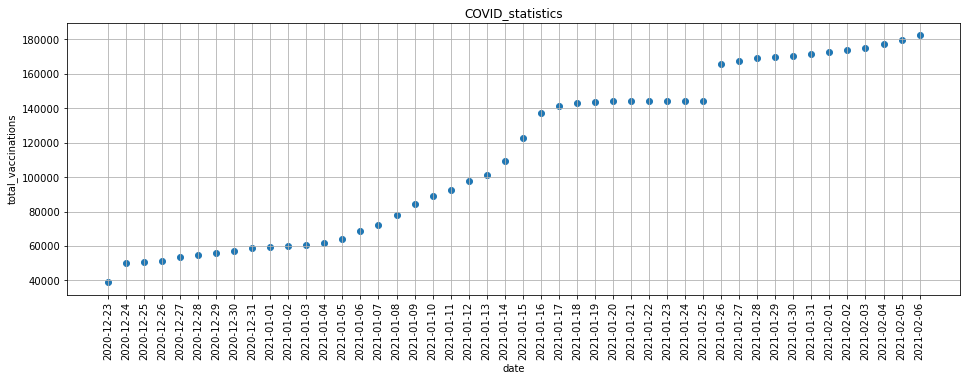

In [22]:
fig = plt.figure(figsize = (16, 5))
plt.scatter(X_covid_B['date'], X_covid_B['total_vaccinations'].interpolate(method='pad'))
plt.title('COVID_statistics')
plt.xlabel('date')
plt.ylabel('total_vaccinations')
plt.xticks(rotation=90)
plt.grid()
None

Или интерполируем квадратичным сплайном.

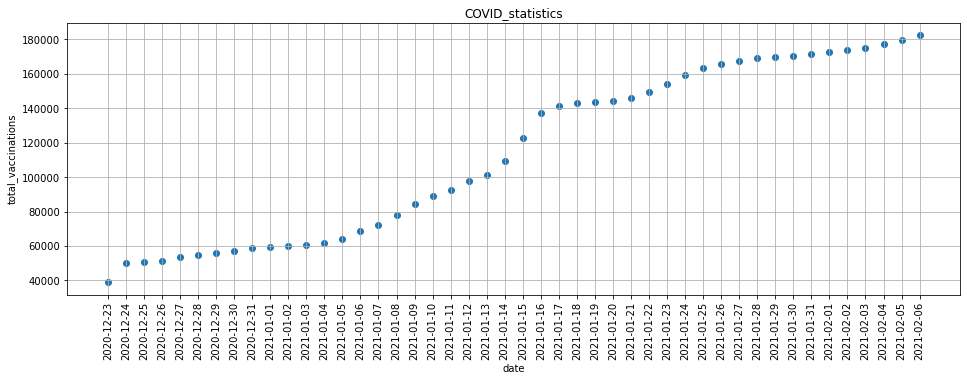

In [23]:
fig = plt.figure(figsize = (16, 5))
plt.scatter(X_covid_B['date'], X_covid_B['total_vaccinations'].interpolate(method='spline', order=2))
plt.title('COVID_statistics')
plt.xlabel('date')
plt.ylabel('total_vaccinations')
plt.xticks(rotation=90)
plt.grid()
None

##### Задание  4 (0.5 балла)
Выполните задание для датасета _hr_.

Есть ли в данных выбросы? Если да, то скажите, какие и почему Вы считаете их выбросами?


Выведем тепловую карту для того, чтобы посмотреть,сколько значений пропущены в исходных данных.

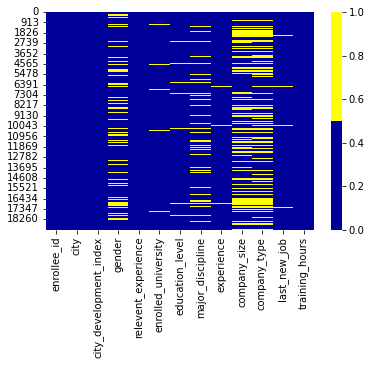

In [25]:
colours = ['#000099', '#ffff00']
sns.heatmap(X_hr.isnull(), cmap=sns.color_palette(colours))
None

Желтым цветом обозначены пропуски.

Судя по тепловой карте, имеется достаточно много пропусков в gender, company_type, company_size и major_discipline.

По тепловой карте сложно сказать, есть ли выборсы. Попробуем взглянуть на статистику числовых признаков.

In [26]:
X_hr.describe()

,enrollee_id,city_development_index,training_hours
count,19158.000000,19158.000000,19158.000000
mean,16875.358179,0.828848,65.366896
std,9616.292592,0.123362,60.058462
min,1.000000,0.448000,1.000000
25%,8554.250000,0.740000,23.000000
50%,16982.500000,0.903000,47.000000
75%,25169.750000,0.920000,88.000000
max,33380.000000,0.949000,336.000000


В столбце training_hours возможно есть выбросы, поскольку максимальное значение больше, чем в 4 раза, чем 75-перцентиль. При этом, 95-перцентиль, исходя из проведенного ранее анализа, равен 188. Поэтому максимальное значение 336 скорее всего выборс.

В столбце city_development_index тоже возможно есть выборсы, так как минимальное значение 0.448 почти в 2 раза меньше, чем 5-прецентиль, который равен 0.624, поэтому 0.448 скорее всего выброс.

### Задание  5 (1 балл)
Выполните задание для датасета _hr_.

Закодируйте категориальные признаки при помощи One-hot encoding/Label encoding/Frequency encoding. Объясните свой выбор. (Обратите внимание, что некоторые категориальные признаки предполагают ранжирование в своих значениях)


In [32]:
def encode(X):
    dict_comp_size = {'10/49' : 1, '100-500' : 3, '1000-4999' : 5, '10000+' : 7,
                     '50-99' : 2, '500-999' : 4, '5000-9999' : 6, '<10' : 0}
    dict_last_job = {'1' : 1, '2' : 2, '3' : 3, '4' : 4, '>4' : 5, 'never' : 0}
    dict_exp = {'15' : 15, '8' : 8, '<1' : 0, '3' : 3, '10' : 10, '11' : 11,
                '13' : 13, '>20' : 21, '17' : 17, '19' : 19, '6' : 6, '18' : 18,
                '16' : 16, '5' : 5, '7' : 7, '20' : 20, '12' : 12, '9' : 9,
                '14' : 14, '1' : 1, '4' : 4, '2' : 4}
    
    list_city = list(set(X['city']))
    list_city_num = [int(s[5:]) for s in list_city]
    dict_city = dict(zip(list_city, list_city_num))
    
    dict_comp_t = dict(zip(list(set(X['company_type'])), [0, 1, 2, 3, 4, 5]))
    maj_disc = dict(zip(list(set(X['major_discipline'])), [0, 1, 2, 3, 4, 5]))
    
    X['city_encode'] = X['city'].map(dict_city)
    X = pd.get_dummies(X, prefix=['gender'], columns=['gender'])
    fe_eu = X.groupby('enrolled_university').size()/len(X)
    X.loc[:, 'enrol_freq_encode'] = X['enrolled_university'].map(fe_eu)
    fe_re = X.groupby('relevent_experience').size()/len(X)
    X.loc[:, 'rel_exp_freq_encode'] = X['relevent_experience'].map(fe_re)
    fe_el = X.groupby('education_level').size()/len(X)
    X.loc[:, 'edu_lvl_freq_encode'] = X['education_level'].map(fe_el)
    X['maj_disc_encode'] = X['major_discipline'].map(maj_disc)
    X['exp_encode'] = X['experience'].map(dict_exp)
    X['comp_size_encode'] = X['company_size'].map(dict_comp_size)
    X['comp_type_encode'] = X['company_type'].map(dict_comp_t)
    X['last_job_encode'] = X['last_new_job'].map(dict_last_job)
    
    X_encode = X.drop(columns=['city', 'relevent_experience',
                               'enrolled_university', 'education_level',
                               'major_discipline', 'experience', 
                               'company_size', 'company_type', 'last_new_job'])
    
    return X_encode

In [33]:
X_hr_encode = encode(X_hr_fill)

Признаки education_level, last_new_job и company_size являются порядковыми, поэтому для кодирования их числовыми необходимо это учесть таким образом, чтобы Label encoding имел большие значения для большего порядка и меньшие для меньшего. Frequency encoding будем использовать для тех переменных, чья частота связана с target. Например, для кодирования relevent_experience, enrolled_university, education_level, целесообразнее использовать frequency encoding. One-hot-encoding используем для gender, поскольку модель не должна обучаться таким образом, чтобы считать, что какие-то значения лучше других. Это увеличит, однако, размерность датасета на 2.

### Задание  5 (1 балл)
Выполните задание для датасета _hr_.




#### 1.  (1 балл)
Реализуйте функцию undersampling

#### 2.  (1 балл)
Реализуйте функцию oversampling

In [35]:
def undersampling(X, y):
    one_target = len(y[y['target'] == 1])
    zero_target = y[y['target'] == 0].index
    random_indices = np.random.choice(zero_target, one_target, replace=False)
    one_indices = y[y['target'] == 1].index
    under_sample_indices = np.concatenate([one_indices, random_indices])
    y_under = y.loc[under_sample_indices]
    X_under = X.loc[under_sample_indices]
    return X_under, y_under

def oversampling(X, y):
    zero_target = len(y[y['target'] == 0])
    one_target = y[y['target'] == 1].index
    random_indices = np.random.choice(one_target, zero_target, replace=True)
    zero_indices = y[y['target'] == 0].index
    over_sample_indices = np.concatenate([zero_indices, random_indices])
    index = [i for i in range(len(over_sample_indices))]
    X_over, y_over = X.loc[over_sample_indices], y.loc[over_sample_indices]
    X_over.index, y_over.index = index, index
    return X_over, y_over

In [36]:
X_hr_under, y_hr_under = undersampling(X_hr_encode, y_hr_fill)

X_hr_over, y_hr_over = oversampling(X_hr_encode, y_hr_fill)

#### 3.  (1 балл)
Используйте _SMOTE_ для балансировки датасета.

Помимо методов _undersampling_ и _oversampling_ существует подход, генерирующий элементы класса-меньшинства, похожие на уже присутствующие в выборке данных. Такой метод называется _Synthetic Minority Oversampling Technique_ (SMOTE). 

Метод _SMOTE_ , реализованный в библиотеке `imblearn`, генерирует синтетические примеры при помощи __k-nearest neighbor__ алгоритма (подробнее об этом алгоритме будет рассказано на лекции).

In [37]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_hr_SMOTE, y_hr_SMOTE = smote.fit_resample(X_hr_encode, y_hr_fill)

#### 4. (0.5 балла)
Как изменились распределения признаков при различных тактиках балансирования датасета?

Посмотрим на основные статистики данных

In [63]:
X_hr_encode.describe()

,enrollee_id,city_development_index,training_hours,enrol_freq_encode,city_encode,gender_Female,gender_Male,gender_Other,rel_exp_freq_encode,edu_lvl_freq_encode,maj_disc_encode,exp_encode,comp_size_encode,comp_type_encode,last_job_encode
count,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000,19158.000000
mean,16875.358179,0.828848,65.366896,0.591985,80.128876,0.064621,0.925410,0.009970,0.596719,0.459768,2.081167,10.254776,2.864861,4.436945,1.978338
std,9616.292592,0.123362,60.058462,0.254575,46.413570,0.245861,0.262736,0.099352,0.197502,0.225661,0.572407,6.669380,1.910006,1.400850,1.663502
min,1.000000,0.448000,1.000000,0.062533,1.000000,0.000000,0.000000,0.000000,0.280092,0.016077,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8554.250000,0.740000,23.000000,0.196106,21.000000,0.000000,1.000000,0.000000,0.280092,0.227633,2.000000,4.000000,2.000000,5.000000,1.000000
50%,16982.500000,0.903000,47.000000,0.741361,101.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,9.000000,2.000000,5.000000,1.000000
75%,25169.750000,0.920000,88.000000,0.741361,104.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,16.000000,3.000000,5.000000,3.000000
max,33380.000000,0.949000,336.000000,0.741361,180.000000,1.000000,1.000000,1.000000,0.719908,0.629398,5.000000,21.000000,7.000000,5.000000,5.000000


In [64]:
X_hr_under.describe()

,enrollee_id,city_development_index,training_hours,enrol_freq_encode,city_encode,gender_Female,gender_Male,gender_Other,rel_exp_freq_encode,edu_lvl_freq_encode,maj_disc_encode,exp_encode,comp_size_encode,comp_type_encode,last_job_encode
count,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000
mean,17102.411346,0.805194,64.239167,0.574840,76.509734,0.066464,0.923802,0.009734,0.581666,0.469547,2.078710,9.575570,2.792443,4.478857,1.914486
std,9558.526498,0.134392,58.993488,0.262003,47.364269,0.249105,0.265329,0.098186,0.204193,0.221744,0.565486,6.598868,1.848309,1.361731,1.637042
min,2.000000,0.448000,1.000000,0.062533,1.000000,0.000000,0.000000,0.000000,0.280092,0.016077,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8832.500000,0.624000,23.000000,0.196106,21.000000,0.000000,1.000000,0.000000,0.280092,0.227633,2.000000,4.000000,2.000000,5.000000,1.000000
50%,17433.500000,0.890000,47.000000,0.741361,91.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,8.000000,2.000000,5.000000,1.000000
75%,25192.250000,0.920000,87.000000,0.741361,103.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,15.000000,3.000000,5.000000,3.000000
max,33373.000000,0.949000,336.000000,0.741361,180.000000,1.000000,1.000000,1.000000,0.719908,0.629398,5.000000,21.000000,7.000000,5.000000,5.000000


In [65]:
X_hr_over.describe()

,enrollee_id,city_development_index,training_hours,enrol_freq_encode,city_encode,gender_Female,gender_Male,gender_Other,rel_exp_freq_encode,edu_lvl_freq_encode,maj_disc_encode,exp_encode,comp_size_encode,comp_type_encode,last_job_encode
count,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000
mean,17181.865865,0.804930,64.362457,0.571545,76.484389,0.066372,0.923163,0.010465,0.582422,0.470194,2.080280,9.551526,2.775120,4.486580,1.899346
std,9572.476189,0.134854,58.524127,0.263471,47.532725,0.248936,0.266338,0.101765,0.203882,0.221351,0.561865,6.597942,1.842608,1.346059,1.635542
min,1.000000,0.448000,1.000000,0.062533,1.000000,0.000000,0.000000,0.000000,0.280092,0.016077,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8933.500000,0.624000,23.000000,0.196106,21.000000,0.000000,1.000000,0.000000,0.280092,0.227633,2.000000,4.000000,2.000000,5.000000,1.000000
50%,17442.000000,0.890000,47.000000,0.741361,91.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,7.000000,2.000000,5.000000,1.000000
75%,25349.750000,0.920000,88.000000,0.741361,103.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,15.000000,3.000000,5.000000,3.000000
max,33380.000000,0.949000,336.000000,0.741361,180.000000,1.000000,1.000000,1.000000,0.719908,0.629398,5.000000,21.000000,7.000000,5.000000,5.000000


In [66]:
X_hr_SMOTE.describe()

,enrollee_id,city_development_index,training_hours,enrol_freq_encode,city_encode,gender_Female,gender_Male,gender_Other,rel_exp_freq_encode,edu_lvl_freq_encode,maj_disc_encode,exp_encode,comp_size_encode,comp_type_encode,last_job_encode
count,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000,28762.000000
mean,17151.965023,0.803474,63.082435,0.572141,75.615048,0.044990,0.898477,0.006641,0.583108,0.471319,2.052813,9.382519,2.676831,4.435922,1.777380
std,9546.830730,0.130057,56.772387,0.246875,46.688314,0.207286,0.302025,0.081221,0.191063,0.209396,0.522794,6.322586,1.751376,1.339132,1.555187
min,1.000000,0.448000,1.000000,0.062533,1.000000,0.000000,0.000000,0.000000,0.280092,0.016077,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8948.000000,0.657764,24.000000,0.292849,21.000000,0.000000,1.000000,0.000000,0.325142,0.227633,2.000000,4.000000,2.000000,5.000000,1.000000
50%,17431.500000,0.878000,46.000000,0.741361,90.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,7.000000,2.000000,5.000000,1.000000
75%,25272.750000,0.920000,84.000000,0.741361,103.000000,0.000000,1.000000,0.000000,0.719908,0.629398,2.000000,14.000000,3.000000,5.000000,2.000000
max,33380.000000,0.949000,336.000000,0.741361,180.000000,1.000000,1.000000,1.000000,0.719908,0.629398,5.000000,21.000000,7.000000,5.000000,5.000000


In [58]:
name_new = ['enrollee_id', 'city_development_index', 'training_hours',
            'enrol_freq_encode', 'city_encode', 'gender_Female',
            'gender_Male', 'gender_Other', 'rel_exp_freq_encode', 
            'edu_lvl_freq_encode', 'maj_disc_encode', 'exp_encode',
            'comp_size_encode', 'comp_type_encode', 'last_job_encode']

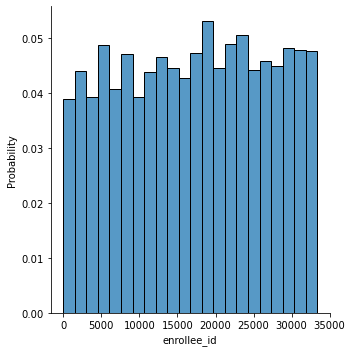

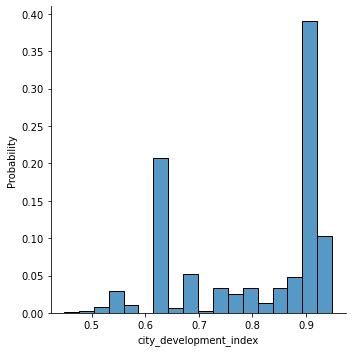

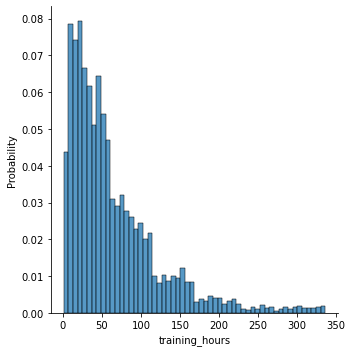

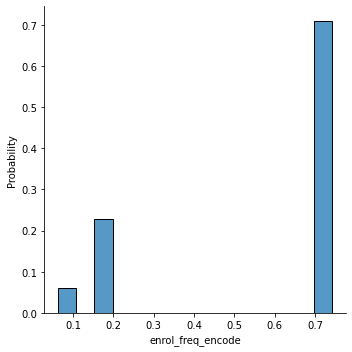

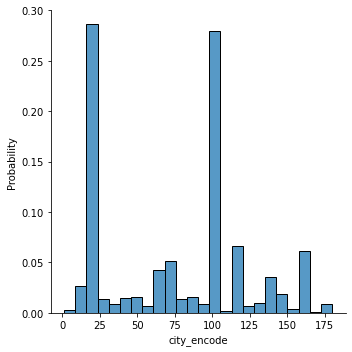

...

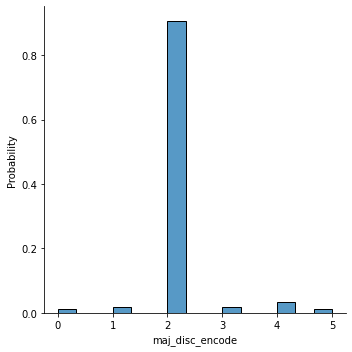

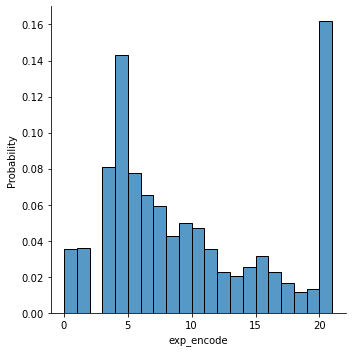

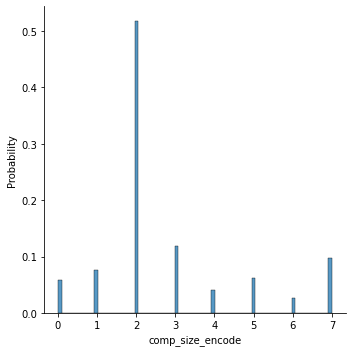

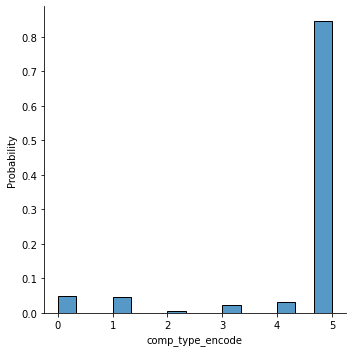

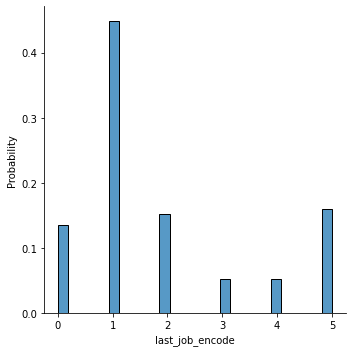

In [59]:
stat_cat(name_new, [], X_hr_under)

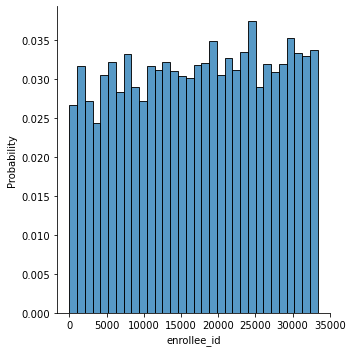

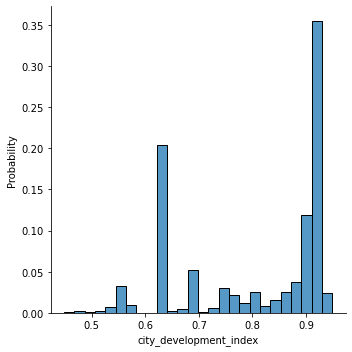

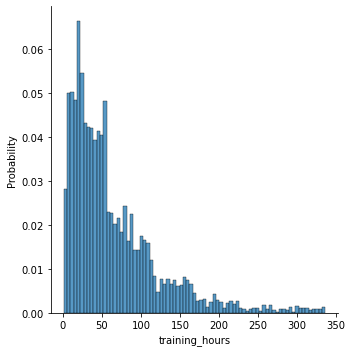

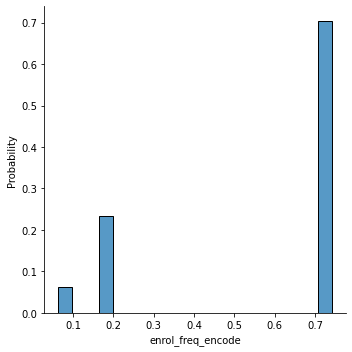

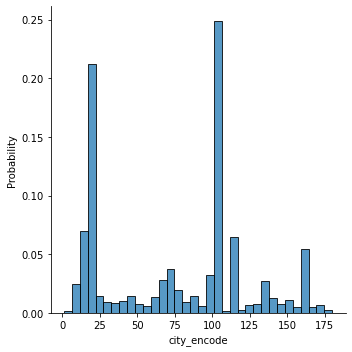

...

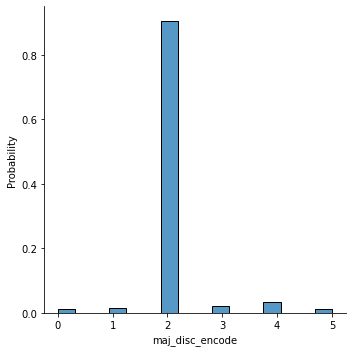

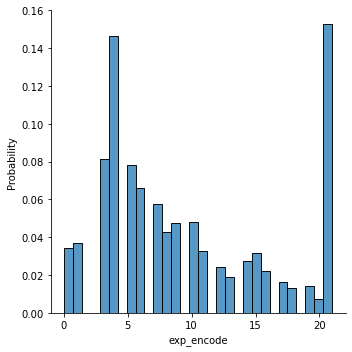

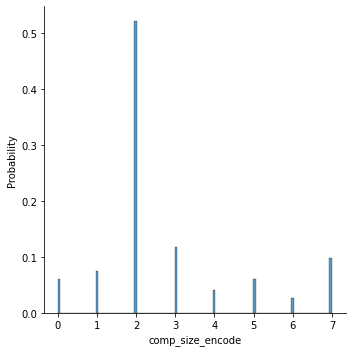

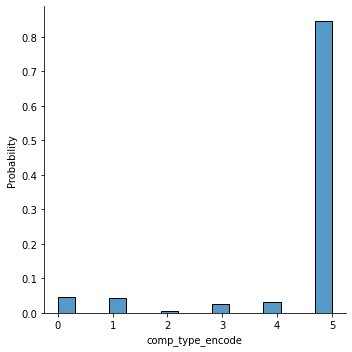

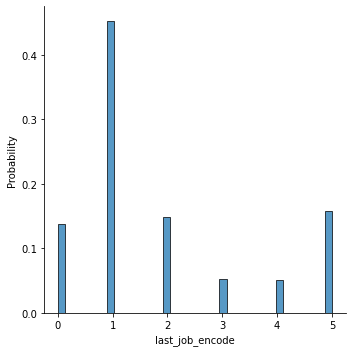

In [60]:
stat_cat(name_new, [], X_hr_over)

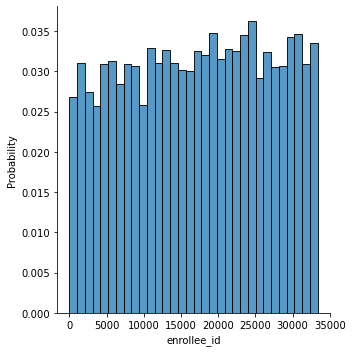

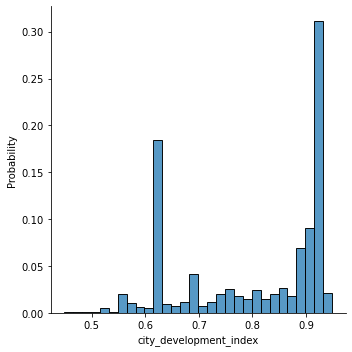

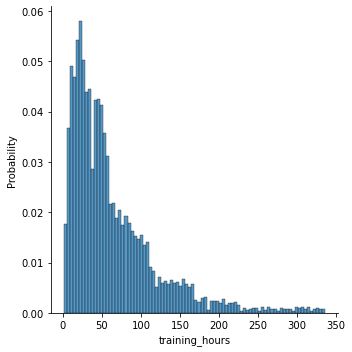

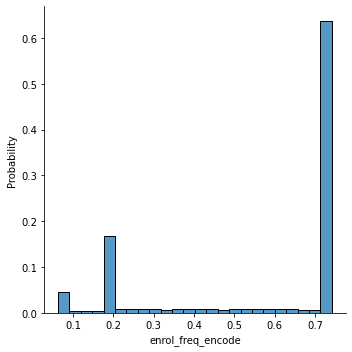

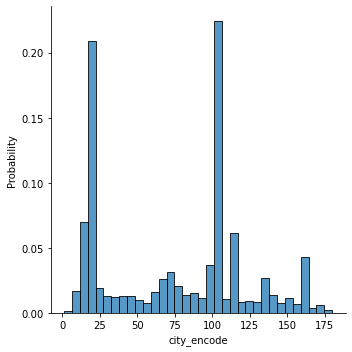

...

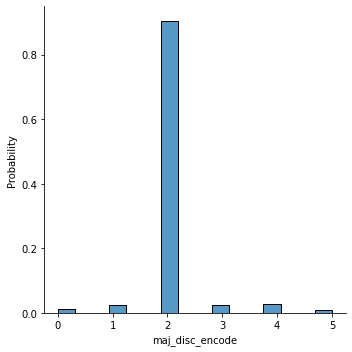

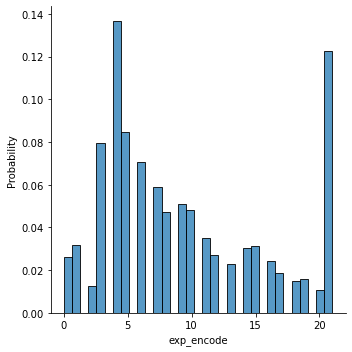

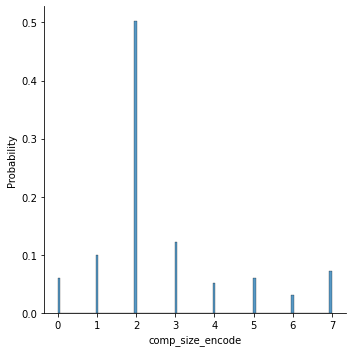

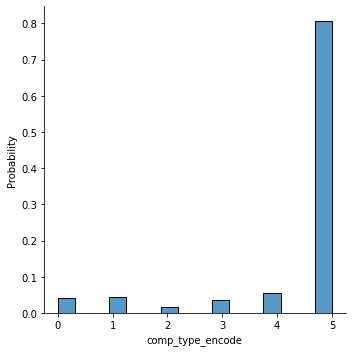

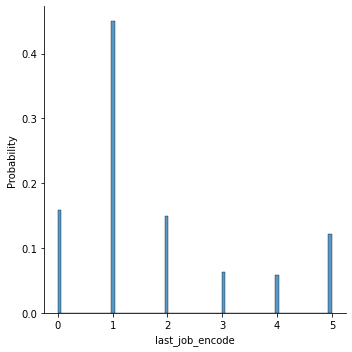

In [61]:
stat_cat(name_new, [], X_hr_SMOTE)

Средние значения уменьшились для всех трех балансировок. Самое большое стандартное отклонение наблюдается для oversampling для всех числовых признаков. Для SMOTE наблюдается самое минимальное стандартное отклонение. Для city наблюдается изменение моды в случае undersamplimg. Для остальных признаков значения также изменились незначительно, при этом для SMOTE 